### For the best experience, view this notebook on nbviewer:
[Open in nbviewer](https://nbviewer.org/github/ArturKosma/Learning/blob/main/jupyter/ai_for_games/exercises_3.12-3.14.ipynb)

In [1]:
import leqanimlib
import leqmath
import numpy as np

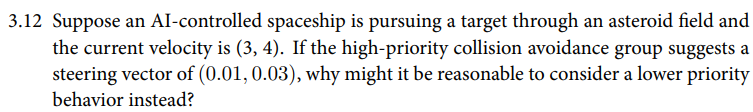

If we are being offered a very small steering vector, that would mean this particular group isn't very useful at the moment.

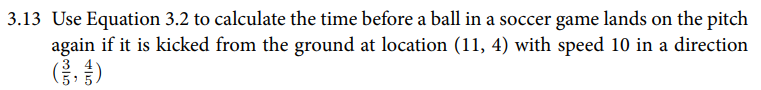

Projectile moves with:

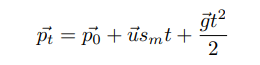

It will arrive to p_yt at this time:

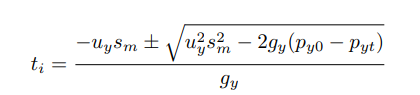

t_i - Time at which we reach p_yt  
u_y - y-component of the direction the projectile was fired at  
s_m - Speed (scalar) with which the projectile left the muzzle  
g_y - y-component of the gravity  
p_y0 - Starting y-position  
p_yt - Ending y-position  

In [2]:
ex3_13 = leqanimlib.leqanimlib(xlim_max=40, ylim_max=40, title='Soccer Ball - Time Falling', frame_num=180)

starting_pos = np.array([11, 4], dtype=float)
ball = ex3_13.add_object(ex3_13.Dot(starting_pos, color='black'))
ball.arrow_enabled = False
ball.transform_text_pos = True

kick_dir = np.array([3/5, 4/5], dtype=float)
strength = 10.0
g = np.array([0, -9.81], dtype=float)

# Calculate the time of arrival.
# We can greatly simplify the formula because we know p_y0 == p_yt but I won't do it so that later on I can use it on a broader scale.

# y-component of the direction the ball was kicked at.
u_y = kick_dir[1]

# Strength of the kick or speed of projectile leaving muzzle.
s_m = strength

# y-component of the gravity.
g_y = g[1]

# y-component of the starting position.
p_y0 = ball.pos[1]

# y-component of the ending position.
p_yt = p_y0

# The formula gives us two solutions with + and - before the square root.
# One of the results is usually 0.

t_i0 = ((-1.0 * u_y * s_m) + np.sqrt(((u_y * u_y) * (s_m * s_m)) - (2.0 * g_y * (p_y0 - p_yt)))) / g_y
t_i1 = ((-1.0 * u_y * s_m) - np.sqrt(((u_y * u_y) * (s_m * s_m)) - (2.0 * g_y * (p_y0 - p_yt)))) / g_y

print(t_i0)
print(t_i1)

time_passed = 0.0

# Move the ball according to the projectile movement.
def tick_ex3_13(t):

    global time_passed
    
    ball.pos = starting_pos + (kick_dir * strength * time_passed) + (g * time_passed * time_passed) / 2
    
    time_passed += 0.016 # Each frame should take 1/60th of a second.

ex3_13.draw(tick_ex3_13)

-0.0
1.6309887869520896


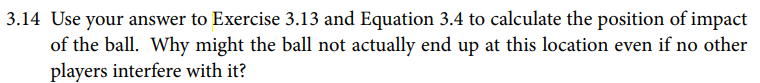

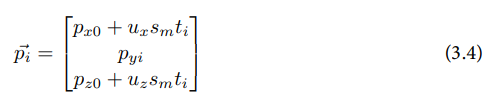

Once we know time of arrival at p_yi, we are able to use that time to find other component of p_i.

In [3]:
pi_x = starting_pos[0] + kick_dir[0] * s_m * t_i1
print(pi_x)

20.785932721712538


In [4]:
# The ball might not end up at that location if the ground level changes.

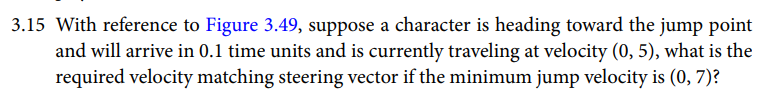

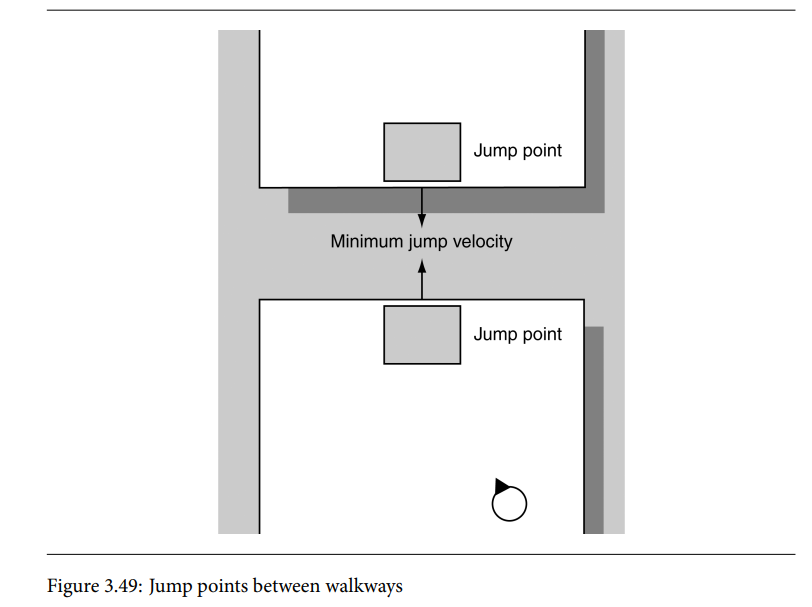

I have to speed up by (0, 2) in a matter of 0.1 time unit. That means I need to apply additional (0, 20) acceleration.

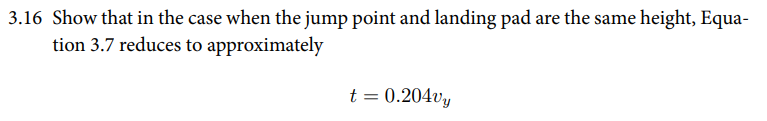

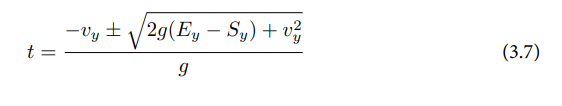

With jump point and landing pad on the same height, the multiplication part 2g(Ey-Sy) zeroes out.

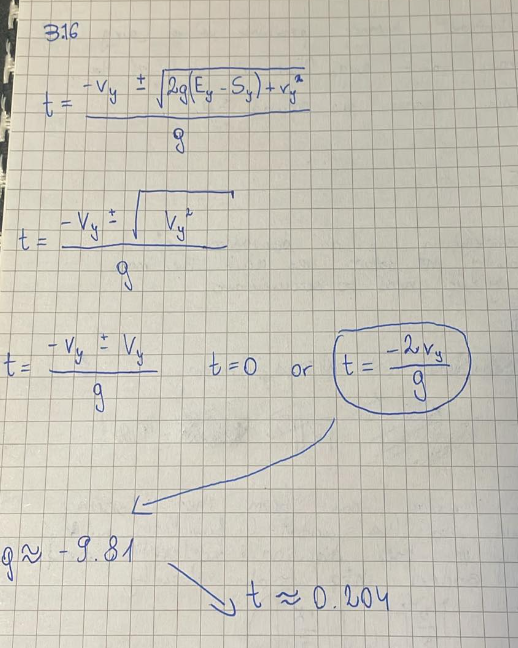

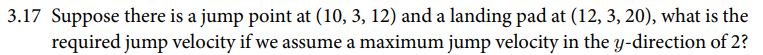

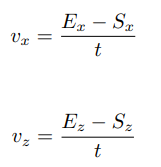

In [6]:
S = np.array([10, 3, 12], dtype=float)
E = np.array([12, 3, 20], dtype=float)
v_y = 2
g = -9.81

t1 = (-1.0 * v_y + np.sqrt(2 * g * (E[1] - S[1]) + (v_y * v_y))) / g
t2 = (-1.0 * v_y - np.sqrt(2 * g * (E[1] - S[1]) + (v_y * v_y))) / g

print(t1)
print(t2)

-0.0
0.4077471967380224


We pick T2 as time has to be positive.

In [8]:
v_x = (E[0] - S[0]) / t2
v_z = (E[2] - S[2]) / t2

v = np.array([v_x, v_y, v_z], dtype=float)

print(v)

[ 4.905  2.    19.62 ]
